<a href="https://colab.research.google.com/github/Mostafa-Hesham1/Graduation-project/blob/Mostafa-Hesham-220367/vmd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!kaggle datasets download -d cyizhuo/stanford-cars-by-classes-folder
!unzip stanford-cars-by-classes-folder.zip -d /content/cars_by_classes


Streaming output truncated to the last 5000 lines.
  inflating: /content/cars_by_classes/train/Chrysler Aspen SUV 2009/006128.jpg  
  inflating: /content/cars_by_classes/train/Chrysler Aspen SUV 2009/006129.jpg  
  inflating: /content/cars_by_classes/train/Chrysler Aspen SUV 2009/006130.jpg  
  inflating: /content/cars_by_classes/train/Chrysler Aspen SUV 2009/006131.jpg  
  inflating: /content/cars_by_classes/train/Chrysler Aspen SUV 2009/006132.jpg  
  inflating: /content/cars_by_classes/train/Chrysler Aspen SUV 2009/006133.jpg  
  inflating: /content/cars_by_classes/train/Chrysler Aspen SUV 2009/006134.jpg  
  inflating: /content/cars_by_classes/train/Chrysler Aspen SUV 2009/006135.jpg  
  inflating: /content/cars_by_classes/train/Chrysler Aspen SUV 2009/006136.jpg  
  inflating: /content/cars_by_classes/train/Chrysler Aspen SUV 2009/006137.jpg  
  inflating: /content/cars_by_classes/train/Chrysler Aspen SUV 2009/006138.jpg  
  inflating: /content/cars_by_classes/train/Chrysler Aspen

In [1]:
!pip install -q kaggle

!mkdir -p ~/.kaggle

from google.colab import files
files.upload()

!mv kaggle.json ~/.kaggle/kaggle.json

!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d jutrera/stanford-car-dataset-by-classes-folder

!unzip -q stanford-car-dataset-by-classes-folder.zip -d /content/car_data


mv: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Dataset URL: https://www.kaggle.com/datasets/jutrera/stanford-car-dataset-by-classes-folder
License(s): other
 99% 1.81G/1.83G [00:23<00:00, 154MB/s]
100% 1.83G/1.83G [00:23<00:00, 81.7MB/s]


In [ ]:
!ls /content/cars_by_classes


README.md  test  train


## **Load Dataset and Prepare Data**

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

data_dir = '/content/car_data/car_data/car_data/train'


In [3]:
image_data = []

for class_name in os.listdir(data_dir):
    class_dir = os.path.join(data_dir, class_name)
    if os.path.isdir(class_dir):
        for img_file in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_file)
            image_data.append([img_path, class_name])

df_images = pd.DataFrame(image_data, columns=['image_path', 'model_name'])

df_images.head()


,image_path,model_name
0,/content/car_data/car_data/car_data/train/Dodg...,Dodge Sprinter Cargo Van 2009
1,/content/car_data/car_data/car_data/train/Dodg...,Dodge Sprinter Cargo Van 2009
2,/content/car_data/car_data/car_data/train/Dodg...,Dodge Sprinter Cargo Van 2009
3,/content/car_data/car_data/car_data/train/Dodg...,Dodge Sprinter Cargo Van 2009
4,/content/car_data/car_data/car_data/train/Dodg...,Dodge Sprinter Cargo Van 2009


## **Display Sample Images**

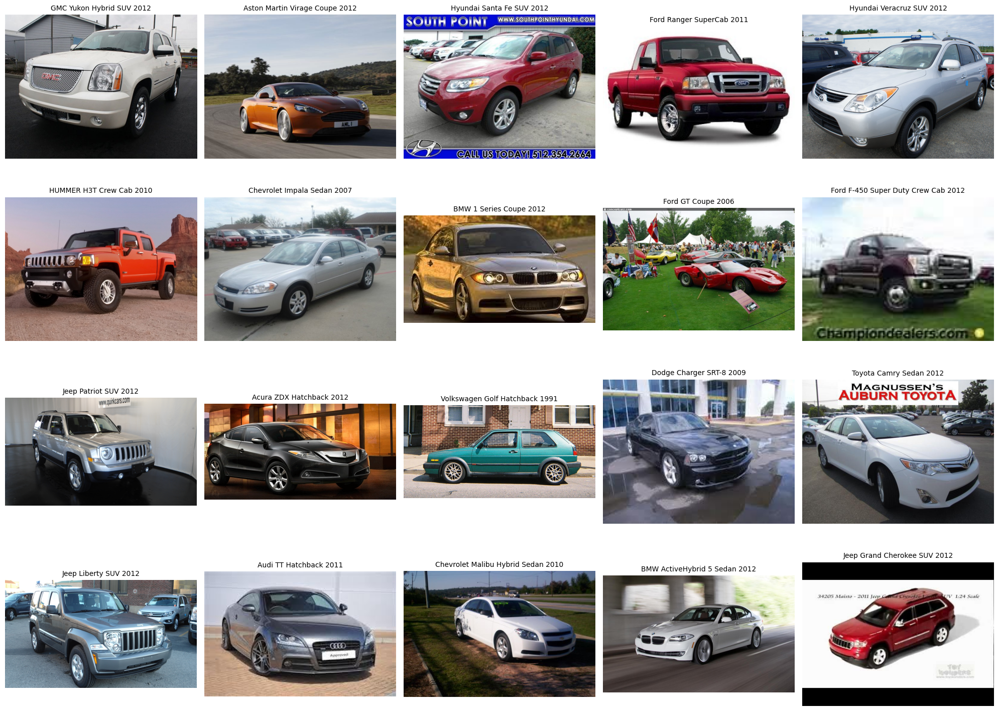

In [4]:
def display_unique_model_images(df, num_images=20):
    unique_models_df = df.drop_duplicates(subset='model_name').sample(num_images, random_state=42)

    fig, axes = plt.subplots(4, 5, figsize=(20, 15))
    axes = axes.flatten()

    for i, ax in enumerate(axes):
        img_path = unique_models_df.iloc[i]['image_path']
        img = mpimg.imread(img_path)
        model_name = unique_models_df.iloc[i]['model_name']
        ax.imshow(img)
        ax.set_title(model_name, fontsize=10)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

display_unique_model_images(df_images, num_images=20)



## Count Classes and Images

In [5]:
num_classes = len(os.listdir(data_dir))
num_images = sum([len(files) for r, d, files in os.walk(data_dir)])

print(f"Number of classes: {num_classes}")
print(f"Number of images: {num_images}")


Number of classes: 196
Number of images: 8144


## **Check for Missing Data**

In [6]:
df_images.sample(10)

print("Checking for missing data...")
print(df_images.isna().sum())


Checking for missing data...
image_path    0
model_name    0
dtype: int64


# **Display Class Distribution**

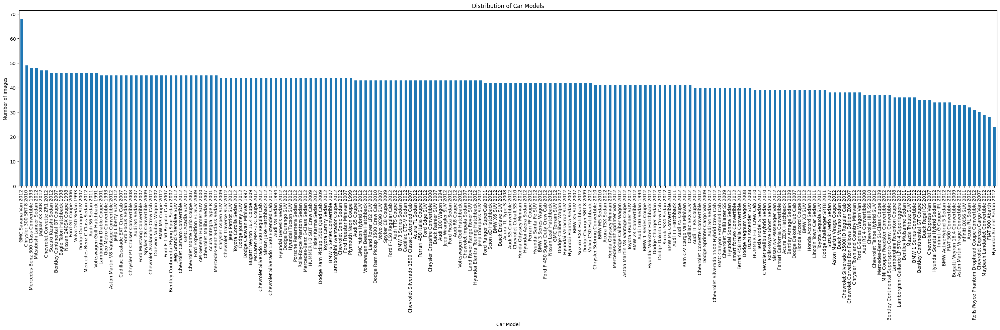

In [7]:
plt.figure(figsize=(30, 10))
df_images['model_name'].value_counts().plot(kind='bar')
plt.title('Distribution of Car Models')
plt.ylabel('Number of images')
plt.xlabel('Car Model')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [8]:
import pandas as pd

car_model_counts = df_images['model_name'].value_counts().reset_index()

car_model_counts.columns = ['Car Model', 'Number of Images']
print(car_model_counts)
from IPython.display import display
display(car_model_counts)


                                             Car Model  Number of Images
0                                  GMC Savana Van 2012                68
1                              Chrysler 300 SRT-8 2010                49
2             Mercedes-Benz 300-Class Convertible 1993                48
3                         Mitsubishi Lancer Sedan 2012                48
4                                   Jaguar XK XKR 2012                47
..                                                 ...               ...
191  Rolls-Royce Phantom Drophead Coupe Convertible...                31
192                   Chevrolet Express Cargo Van 2007                30
193                 Maybach Landaulet Convertible 2012                29
194                               FIAT 500 Abarth 2012                28
195                          Hyundai Accent Sedan 2012                24

[196 rows x 2 columns]


,Car Model,Number of Images
0,GMC Savana Van 2012,68
1,Chrysler 300 SRT-8 2010,49
2,Mercedes-Benz 300-Class Convertible 1993,48
3,Mitsubishi Lancer Sedan 2012,48
4,Jaguar XK XKR 2012,47
...,...,...
191,Rolls-Royce Phantom Drophead Coupe Convertible...,31
192,Chevrolet Express Cargo Van 2007,30
193,Maybach Landaulet Convertible 2012,29
194,FIAT 500 Abarth 2012,28


# **Data Augmentation and Preprocessing**

In [2]:
!pip install fastai
!pip install torch
from google.colab import drive
drive.mount('/content/drive')
from fastai.vision.all import *
from torchvision.models import resnet152
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score

def compute_metrics(preds, targs):
    preds = preds.argmax(dim=1).cpu().numpy()
    targs = targs.cpu().numpy()
    f1 = f1_score(targs, preds, average='weighted')
    precision = precision_score(targs, preds, average='weighted')
    recall = recall_score(targs, preds, average='weighted')
    return f1, precision, recall


Mounted at /content/drive


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
train_path = '/content/car_data/car_data/car_data/train'
test_path = '/content/car_data/car_data/car_data/test'

dls = ImageDataLoaders.from_folder(
    train_path,
    valid_pct=0.2,
    seed=42,
    item_tfms=Resize(460),  # Increase the initial resize for better detail capture
    batch_tfms=[*aug_transforms(size=299, min_scale=0.75), Normalize.from_stats(*imagenet_stats)],
    bs=32
)


/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:303: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
Downloading: "https://download.pytorch.org/models/resnet152-f82ba261.pth" to /root/.cache/torch/hub/checkpoints/resnet152-f82ba261.pth
100%|██████████| 230M/230M [00:12<00:00, 18.8MB/s]


/usr/local/lib/python3.10/dist-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwargs

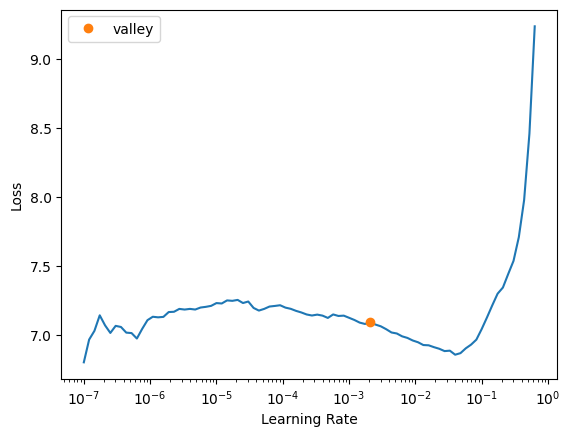

epoch,train_loss,valid_loss,accuracy,time
0,5.250729,3.948827,0.169533,04:01


Better model found at epoch 0 with accuracy value: 0.1695331633090973.


epoch,train_loss,valid_loss,accuracy,time
0,3.318446,2.742173,0.367322,05:21
1,2.356370,2.025413,0.507985,05:16
2,1.663662,1.537982,0.619779,05:14
3,1.270118,1.137969,0.714373,05:27
4,0.877054,0.944714,0.753685,05:17
5,0.685197,0.822075,0.788084,05:14
6,0.561006,0.759190,0.794226,05:15
7,0.535242,0.761461,0.789312,05:14
8,0.467355,0.779753,0.799140,05:13
9,0.456339,0.755996,0.794840,05:13


Better model found at epoch 0 with accuracy value: 0.3673218786716461.
Better model found at epoch 1 with accuracy value: 0.5079852342605591.
Better model found at epoch 2 with accuracy value: 0.6197788715362549.
Better model found at epoch 3 with accuracy value: 0.7143734693527222.
Better model found at epoch 4 with accuracy value: 0.753685474395752.
Better model found at epoch 5 with accuracy value: 0.788083553314209.
Better model found at epoch 6 with accuracy value: 0.7942260503768921.
Better model found at epoch 8 with accuracy value: 0.7991400361061096.
Better model found at epoch 10 with accuracy value: 0.812039315700531.
Better model found at epoch 12 with accuracy value: 0.8132678270339966.
Better model found at epoch 13 with accuracy value: 0.8261670470237732.
Better model found at epoch 14 with accuracy value: 0.8452088236808777.
Better model found at epoch 17 with accuracy value: 0.851965606212616.
Better model found at epoch 19 with accuracy value: 0.8550368547439575.
Bett

In [5]:
learn = cnn_learner(dls, resnet152, metrics=[accuracy])
learn.lr_find()
plt.show()  # Show the plot to choose the best learning rate
from fastai.callback.tracker import SaveModelCallback

# Train the model and save the best model based on accuracy
learn.fine_tune(
    epochs=40,
    base_lr=3e-3,
    cbs=[SaveModelCallback(monitor='accuracy', fname='best_model')]  # Callback to save the best model based on accuracy
)





In [6]:
learn.load('best_model')

learn.export('/content/drive/MyDrive/resnet152_best_model.pkl')

print("Model training complete and exported.")

/usr/local/lib/python3.10/dist-packages/fastai/learner.py:61: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


Model training complete and exported.


In [ ]:
learn.export('/content/drive/MyDrive/resnet152_best_model.pkl')


In [2]:
from fastai.vision.all import *
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
import torch.nn.functional as F


In [5]:
learn = load_learner('/content/drive/MyDrive/resnet152_best_model.pkl')

test_path = '/content/car_data/car_data/car_data/test'
test_files = get_image_files(test_path)
test_dl = learn.dls.test_dl(test_files, with_labels=True)  # Ensure this is set if possible


In [6]:
# Fetch predictions and actual targets
preds, targs = learn.get_preds(dl=test_dl)

if targs is None:
    raise ValueError("No targets found. Check your DataLoader configuration.")

loss = F.cross_entropy(preds, targs).item()

pred_class = preds.argmax(dim=-1)
final_accuracy = accuracy_score(targs.numpy(), pred_class.numpy())
final_precision = precision_score(targs.numpy(), pred_class.numpy(), average='weighted')
final_recall = recall_score(targs.numpy(), pred_class.numpy(), average='weighted')
final_f1 = f1_score(targs.numpy(), pred_class.numpy(), average='weighted')
results_df = pd.DataFrame({
    "Metrics": ["Accuracy", "Precision", "Recall", "F1 Score"],
    "Values": [f"{final_accuracy:.4%}", f"{final_precision:.4f}", f"{final_recall:.4f}", f"{final_f1:.4f}"]
})
print(results_df)


     Metrics    Values
0   Accuracy  89.5162%
1  Precision    0.8997
2     Recall    0.8952
3   F1 Score    0.8949


In [7]:
report = classification_report(targs.numpy(), pred_class.numpy(), target_names=learn.dls.vocab)
print("Classification Report:\n", report)


Classification Report:
                                                         precision    recall  f1-score   support

                            AM General Hummer SUV 2000       0.87      0.91      0.89        44
                             Acura Integra Type R 2001       0.91      0.91      0.91        44
                                   Acura RL Sedan 2012       0.76      0.81      0.79        32
                                   Acura TL Sedan 2012       0.87      0.93      0.90        43
                                  Acura TL Type-S 2008       0.98      1.00      0.99        42
                                  Acura TSX Sedan 2012       0.97      0.88      0.92        40
                              Acura ZDX Hatchback 2012       0.92      0.87      0.89        39
              Aston Martin V8 Vantage Convertible 2012       0.67      0.76      0.71        45
                    Aston Martin V8 Vantage Coupe 2012       0.93      0.61      0.74        41
               

Processing images:   0%|          | 0/8041 [00:00<?, ?it/s]

Number of correctly classified images: 7198
Number of misclassified images: 843


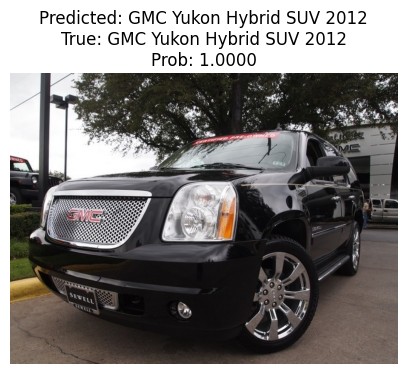

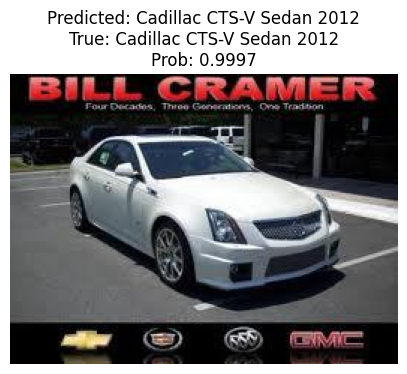

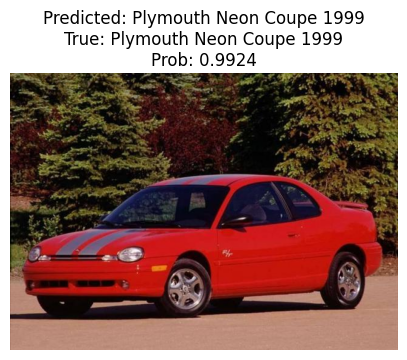

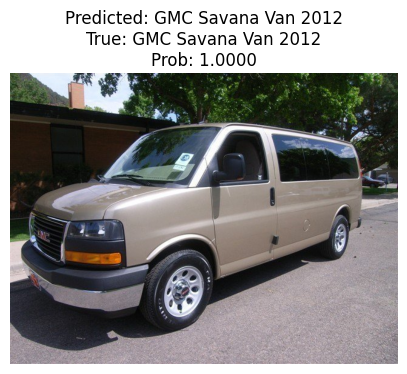

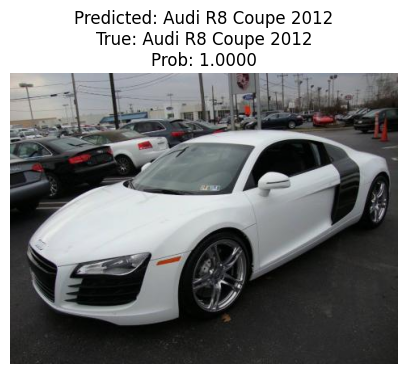

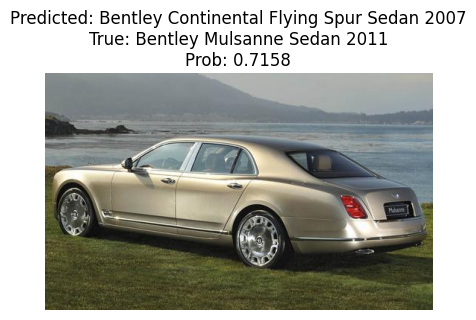

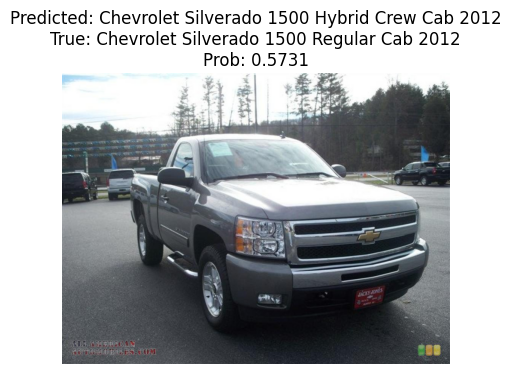

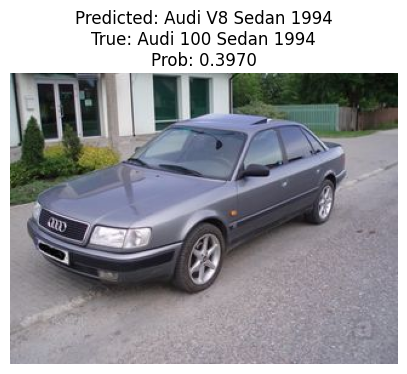

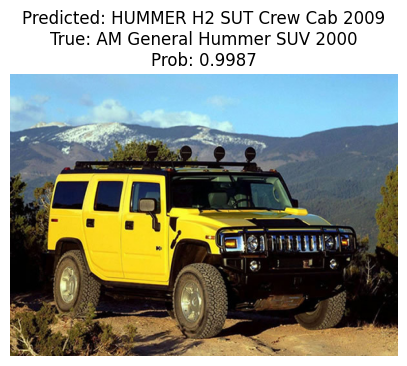

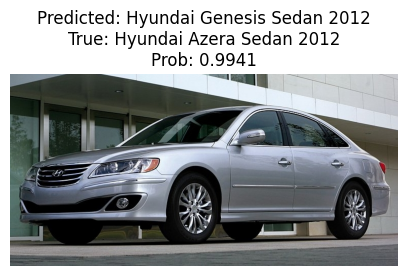

In [9]:
import pandas as pd
from fastai.vision.all import *
from tqdm.auto import tqdm
from PIL import Image
import matplotlib.pyplot as plt
learn = load_learner('/content/drive/MyDrive/resnet152_best_model.pkl')
test_path = '/content/car_data/car_data/car_data/test'
test_files = get_image_files(test_path)
if not test_files:
    raise ValueError("No test files found. Check the test_path!")

results = []

for img in tqdm(test_files, desc='Processing images'):
    pred, _, probs = learn.predict(img)
    is_correct = pred == img.parent.name
    results.append({
        'Image': img.name,
        'True Label': img.parent.name,
        'Predicted Label': pred,
        'Probability': max(probs).item(),
        'Correct': is_correct
    })

df_results = pd.DataFrame(results)

if df_results.empty:
    raise ValueError("No predictions were made. Results DataFrame is empty.")

df_results.to_csv('/content/drive/MyDrive/all_classification_results.csv', index=False)

correctly_classified = df_results[df_results['Correct']]
correctly_classified.to_csv('/content/drive/MyDrive/correct_classification_results.csv', index=False)

misclassified = df_results[~df_results['Correct']]
misclassified.to_csv('/content/drive/MyDrive/misclassified_results.csv', index=False)

print(f"Number of correctly classified images: {len(correctly_classified)}")
print(f"Number of misclassified images: {len(misclassified)}")

for index, row in correctly_classified.sample(n=5, replace=True).iterrows():  # Use replace=True if n > number of rows
    img_path = test_path + '/' + row['True Label'] + '/' + row['Image']
    image = Image.open(img_path)
    plt.figure(figsize=(5, 5))
    plt.imshow(image)
    plt.title(f"Predicted: {row['Predicted Label']}\nTrue: {row['True Label']}\nProb: {row['Probability']:.4f}")
    plt.axis('off')
    plt.show()

for index, row in misclassified.sample(n=5, replace=True).iterrows():  # Adjust n for more/less images, use replace=True if n > number of rows
    img_path = test_path + '/' + row['True Label'] + '/' + row['Image']
    image = Image.open(img_path)
    plt.figure(figsize=(5, 5))
    plt.imshow(image)
    plt.title(f"Predicted: {row['Predicted Label']}\nTrue: {row['True Label']}\nProb: {row['Probability']:.4f}")
    plt.axis('off')
    plt.show()


In [5]:
from fastai.vision.all import *
from ipywidgets import FileUpload, widgets
from IPython.display import display, Image
import io

learn = load_learner('/content/drive/MyDrive/resnet152_best_model.pkl')

def on_data_change(change):
    lbl_pred.value = ''

    uploaded_files = change['new']

    out_pl.clear_output()

    for filename, file_info in uploaded_files.items():
        img_content = file_info['content']
        img = PILImage.create(io.BytesIO(img_content))

        with out_pl: display(img.to_thumb(128,128))

        pred, pred_idx, probs = learn.predict(img)
        with out_pl:
            print(f'Prediction for {filename}: {pred}; Probability: {probs[pred_idx]:.04f}')

upload = widgets.FileUpload(accept='image/*', multiple=True)  # Accept multiple images
upload.observe(on_data_change, names=['value'])
out_pl = widgets.Output()

lbl_pred = widgets.Label()

display(widgets.VBox([widgets.Label('Select images:'), upload, out_pl, lbl_pred]))
